In [12]:
import numpy as np
import pandas as pd
import re
import scipy.stats as st
import sklearn.metrics as met
import matplotlib.pyplot as plt
import sklearn.preprocessing as prep
from sklearn.model_selection import StratifiedKFold

from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
import hyperopt.pyll.stochastic

import time
import copy

%matplotlib inline
title = 'PPD'
path = '../sources/data/PPD-First-Round-Data'
icy = 'target'

# def Del_string(xstr):
#     xstrc = xstr.strip().strip(u'市').strip(u'省')
#     if(xstrc == ''):
#         xstrc = np.nan
#     return(xstrc)

## Reload DataSet for Model

In [2]:
pathofDataSaving = '../sources/deal/PPD-Data-Saving'
irt = np.load('{}/{}_irt.npy'.format(pathofDataSaving, title))
irv = np.load('{}/{}_irv.npy'.format(pathofDataSaving, title))
dac = pd.read_hdf('{}/{}_dac.h5'.format(pathofDataSaving, title), key = 'dac')
print dac.shape
print dac.loc[irt, icy].value_counts()/dac.loc[irt, icy].shape[0]
# dac.loc[:, [icy]]
# dac.loc[:, icy]

(49999, 389)
0.0    0.926733
1.0    0.073267
Name: target, dtype: float64


## DataSet Division, Missing Deal & Standardization

xt -  
yt -  
xv -  

In [3]:
y = dac.loc[:, [icy]]
icx = list(set(dac.columns) - set([icy]))
x = dac.loc[:, icx]
x = x.apply(lambda x: x.fillna(x.median()),axis=0) # 使用中位数填充缺失值
x = (x.rank(pct = True)-0.5/x.shape[0]).apply(st.norm.ppf) # 正态标准化
#x = (x - x.mean())/x.std() # 中心归一标准化
xt = x.loc[irt, :].values
yt = y.loc[irt, :].values
xv = x.loc[irv, :].values

In [4]:
# TrainSet
# 特别需要注意yt的shape
print xt.shape
print yt.shape
print yt.flatten().shape
# https://stackoverflow.com/questions/35022463/stratifiedkfold-indexerror-too-many-indices-for-array
# Check the shape of skew_gendata_targets.values. You'll see that it isn't a 1d array (shape (500,) ) as StratifiedKFold expects, but rather a (500,1) array. SKlearn treats these separately rather than coercing them to be the same. Let me know if that helps

(30000, 388)
(30000, 1)
(30000,)


## Definition of Models

#### Model Type: XGBoost

In [5]:
from sklearn.linear_model import LogisticRegression, SGDClassifier
import sklearn.ensemble as ensm
def Classifier(xt1, xt2, yt1, yt2, seed = 0, modeltype = LogisticRegression, parmodel = {}):
    timestart = time.time()
    par = {"random_state": seed, 'n_jobs': -1, "penalty": "l2", "C": 0.003, "class_weight": 'balanced', 'solver': 'sag'}
    par.update(parmodel)
    model = modeltype(**par)
    model.fit(xt1, yt1.flatten())
#     score = Score(yt2, model.predict_proba(xt2)[:,1:])
    print('Time: {:.2f} seconds'.format(time.time() - timestart))
    return(model)

import xgboost as xgb
def XGBoost(xt1, xt2, yt1, yt2, seed = 0, parmodel = {}):
    timestart = time.time()
    xyt1 = xgb.DMatrix(xt1, label = yt1, missing = np.nan)
    xyt2 = xgb.DMatrix(xt2, label = yt2, missing = np.nan)
    # bak origin par setting
    par = {
        'booster': 'gbtree',
        'objective': 'binary:logistic', 
        'eta': 0.1, 
        'max_depth': 4, 
        'sub_sample': 1.0, 
        'min_child_weight': 1, 
        'colsample_bylevel': 0.1, 
        'eval_metric': 'logloss', 
        'seed': seed, 
    }
    par.update(parmodel)
    par['max_depth'] = int(par['max_depth'])
    parval = [(xyt1,'train'), (xyt2,'val')]
    model = xgb.train(params = par, dtrain = xyt1, num_boost_round = 10000, evals = parval, 
                      early_stopping_rounds = int(2*np.sqrt(xt1.shape[1]/par['eta'])))
    score = Score(yt2, ModelPredict(xt2, model))
    print('Time: {:.2f} seconds'.format(time.time() - timestart))
    return(model)

/Users/fanghan/anaconda/lib/python2.7/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


## Training Methods Definition with Cross Validation

Divide sub training and validation sets by **StratifiedKFold**

Functions for models to train, validate and predict Y from data

### Model Training with CV

参考源码 model_selection.cross_val_score()

In [6]:
# rewrite kfolds
# 备注：带交叉验证的training ： crosstrain func() # output： 保存StratifiedKFold切分index & 全部model & 全部score备用
def CrossTrain_new(x, y, fmodel, k=10, **kwargs):
    modelL = []
    irtL_T = []
    irtL_V = [] 
    skf = StratifiedKFold(n_splits=k, random_state=0, shuffle=False)
    for train_index, valid_index in skf.split(x, y.flatten()):
        irtL_T.append(train_index)
        irtL_V.append(valid_index)
        X_train, X_valid = x[train_index], x[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]
        # print pd.Series(y_train.flatten()).value_counts() / y_train.shape[0]
        # print pd.Series(y_valid.flatten()).value_counts() / y_valid.shape[0]
        modelL.append(fmodel(X_train, X_valid, y_train, y_valid, seed = 0, **kwargs))
        # print '\n'
    return modelL, irtL_T, irtL_V

def CrossTrain_shuffle(x, y, fmodel, k=10, **kwargs):
    modelL = []
    irtL_T = []
    irtL_V = [] 
    skf = StratifiedKFold(n_splits=k, random_state=0, shuffle=True)
    for train_index, valid_index in skf.split(x, y.flatten()):
        irtL_T.append(train_index)
        irtL_V.append(valid_index)
        X_train, X_valid = x[train_index], x[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]
        # print pd.Series(y_train.flatten()).value_counts() / y_train.shape[0]
        # print pd.Series(y_valid.flatten()).value_counts() / y_valid.shape[0]
        modelL.append(fmodel(X_train, X_valid, y_train, y_valid, seed = 0, **kwargs))
        # print '\n'
    return modelL, irtL_T, irtL_V

### Model Validation with CV

In [7]:
# add about ntree_limit/early-stopping func
def ModelPredict(xv, fmodel):
    if(type(fmodel) == xgb.core.Booster):
        xv = xgb.DMatrix(xv, missing = np.nan)
    if(type(fmodel) in [LogisticRegression, SGDClassifier, ensm.bagging.BaggingClassifier,
           ensm.weight_boosting.AdaBoostClassifier, ensm.forest.RandomForestClassifier, ensm.forest.ExtraTreesClassifier]):
        yvp = fmodel.predict_proba(xv)[:,1]
    else:
        if (type(fmodel) == xgb.core.Booster) and fmodel.best_ntree_limit > 0:
            yvp = fmodel.predict(xv, ntree_limit=fmodel.best_ntree_limit).flatten()
        else:
            yvp = fmodel.predict(xv).flatten()
    return(yvp)

def CrossValid_new(x, y, irtL_T, irtL_V, modelL):
    yt2pL = []
    for i in range(len(modelL)):
        xt1, xt2, yt1, yt2 = xt[irtL_T[i]], xt[irtL_V[i]], yt[irtL_T[i]], yt[irtL_V[i]]
        yt2p = ModelPredict(xt2, modelL[i])
        yt2pL.append(yt2p)
    return yt2pL

### Model Score Evaluation with CV

In [8]:
def Score(y, yp, f = met.roc_auc_score):
    score = f(y, yp)
    print("Score: {:.4f}".format(score))
    return(score)

def CrossScore_new(yt, yvpM, irtL_V, w = 1):
    score = []
    for i in range(len(irtL_V)):
        yt2 = yt[irtL_V[i]]
        yvpLw = [yvpM[j][i] for j in range(len(yvpM))]
        if (w is 1):
            score.append(list(map(lambda x: Score(yt2, x), yvpLw)))
        else:
            score.append(Score(yt2, np.array(yvpLw).T * w))
    print 'ValidSet Score with %d-folds: %.4f +/- %.4f'%(len(irtL_V), np.mean(score, axis=0), np.std(score, axis=0))
    return np.array(score)

# CrossScoreAnalysis(y, [yt2pL], irtL)[0]

In [9]:
def ScoreWeight(score):
    w = np.exp((score - np.mean(score))/np.min(np.std(score, axis = 0)))
    w = np.sum(w/np.sum(w), axis = 0)
    return(w)

def CrossScoreAnalysis(y, yvpM, irtL_V, w = [], labels = None):
    scoreL = CrossScore_new(y, yvpM, irtL_V)
    if(len(w) == 0):
        w = ScoreWeight(scoreL)
        print w
    score = CrossScore_new(y, yvpM, irtL_V, w)
    # ScorePlot(np.vstack([score, scoreL.T]).T, labels)
    return(scoreL, score, np.array(w))

## HyperOpt Func

In [10]:
# 5-folds
# CrossTrain five models
# 就是说我把含有默认值的参数放在了不含默认值的参数的前面，这样问题就好解决了，调换一下参数的位置就好了
def ParModelScore(par, fmodel = XGBoost):
    print 'par:', par 
    modelL, irtL_T, irtL_V = CrossTrain_shuffle(xt, yt, fmodel, k = 5, parmodel = par)
    yvpL = CrossValid_new(xt, yt, irtL_T, irtL_V, modelL)
    score = np.mean(CrossScore_new(yt, [yvpL], irtL_V)[0])
    return (-score)

def HpOpt(space, fhpscore, seed = 0, max_evals = 50):
    def Obj(par):
        return({
            'loss': fhpscore(par),
            'status': STATUS_OK,
            'loss_variance': 5e-5
        })
    np.random.seed(seed)
    trials = Trials()
    best = fmin(Obj,
        space=space,
        algo=tpe.suggest,
        max_evals=max_evals,
        trials=trials)
    op = pd.concat([pd.DataFrame([sum(list(trials.trials[i]["misc"]["vals"].values()), []) for i in range(len(trials))],
                                 columns = list(trials.trials[0]["misc"]["vals"].keys())),
           pd.DataFrame({'loss': trials.losses()})], axis = 1)
    return(op)

## XGBoost

#### XGBoost Training with Stratified 10-Folds
批注
bak origin par setting
    par = {
        'booster': 'gbtree',
        'objective': 'binary:logistic', 
        'eta': 0.1, 
        'max_depth': 4, 
        'sub_sample': 1.0, 
        'min_child_weight': 1, 
        'colsample_bylevel': 0.1, 
        'eval_metric': 'logloss', 
        'seed': seed, 
    }

min_child_weight=1.5 重视对该参数的理解； 我认为设置成默认值1就可以了
colsample_bylevel=0.07 用来控制树的每一级的每一次分裂，对列数的采样的占比。仅0.07，我认为采样的列数太少，尤其是sub_sample=1.0
sub_sample 和GBM中的subsample参数一模一样。这个参数控制对于每棵树，随机采样的比例。
gamma[默认0] 在节点分裂时，只有分裂后损失函数的值下降了，才会分裂这个节点。Gamma指定了节点分裂所需的最小损失函数下降值。
lambda[默认1]权重的L2正则化项
eval_metric 我认为应该改成auc

关于early_stopping_rounds参数
early_stopping_rounds = int(2*np.sqrt(xt1.shape[1]/par['eta'])))

### XGBoost Tuning by Hyperopt
#### Default Parameter
par = {
        'booster': 'gbtree',  
        'objective': 'binary:logistic',  
        'eta': 0.1,  
        'max_depth': 4,  
        'sub_sample': 1.0,  
        'min_child_weight': 1,  
        'colsample_bylevel': 0.1,  
        'eval_metric': 'logloss',  
        'seed': seed,  
    }

In [11]:
# space = {'max_depth': hp.quniform("max_depth", 1.0, 5.0, 1),
#          'min_child_weight': hp.loguniform("min_child_weight", -2, 4),
#          'gamma': hp.loguniform("gamma", -6, 2),
#          'lambda': hp.loguniform("lambda", 0, 6),
#          'colsample_bylevel': hp.uniform('colsample_bylevel', 0.04, 0.15)
# }

# space = {'max_depth': hp.quniform('max_depth', 2.0, 8.0, 1),
#          'subsample': 0.8,
#          'colsample_bytree': 0.8,
#          'colsample_bylevel':1,
#         }
space = {'max_depth': 3,
         'subsample': hp.quniform('subsample', 0.1, 1.0, 0.1),
         'colsample_bytree': 0.8,
         'colsample_bylevel':1,
        }
print(hyperopt.pyll.stochastic.sample(space))

{'subsample': 0.7000000000000001, 'colsample_bytree': 0.8, 'max_depth': 3, 'colsample_bylevel': 1}


In [25]:
# 1. Tuning max_depth
space = {'max_depth': hp.quniform('max_depth', 2.0, 8.0, 1),
         'subsample': 0.8,
         'colsample_bytree': 0.8,
         'colsample_bylevel':1,
        }
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 10).sort_values(['loss'])

par: {'subsample': 0.8, 'colsample_bytree': 0.8, 'max_depth': 3.0, 'colsample_bylevel': 1}
[0]	train-logloss:0.623477	val-logloss:0.623686
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.566396	val-logloss:0.566701
[2]	train-logloss:0.519032	val-logloss:0.519436
[3]	train-logloss:0.479364	val-logloss:0.479829
[4]	train-logloss:0.445898	val-logloss:0.446414
[5]	train-logloss:0.417544	val-logloss:0.418175
[6]	train-logloss:0.393191	val-logloss:0.394031
[7]	train-logloss:0.372539	val-logloss:0.373405
[8]	train-logloss:0.354798	val-logloss:0.355889
[9]	train-logloss:0.339313	val-logloss:0.340805
[10]	train-logloss:0.326162	val-logloss:0.327915
[11]	train-logloss:0.314675	val-logloss:0.316722
[12]	train-logloss:0.304737	val-logloss:0.306849
[13]	train-logloss:0.296117	val-logloss:0.298419
[14]	train-logloss:0.288747	val-logloss:0.29117
[15]	train-logloss:0.282384	val-loglo

In [26]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

   max_depth      loss
0        3.0 -0.767213
1        3.0 -0.767213
2        3.0 -0.767213
9        3.0 -0.767213
4        5.0 -0.757869
5        5.0 -0.757869
3        7.0 -0.742598
6        7.0 -0.742598
7        7.0 -0.742598
8        7.0 -0.742598
{'max_depth': 3.0}


In [12]:
# 2. Tuning subsample
space = {'max_depth': 3,
         'subsample': hp.quniform('subsample', 0.1, 1.0, 0.1),
         'colsample_bytree': 0.8,
         'colsample_bylevel':1,
        }
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 15).sort_values(['loss'])

par: {'subsample': 0.2, 'colsample_bytree': 0.8, 'max_depth': 3, 'colsample_bylevel': 1}
[0]	train-logloss:0.624503	val-logloss:0.624705
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.568002	val-logloss:0.568361
[2]	train-logloss:0.520281	val-logloss:0.520766
[3]	train-logloss:0.480306	val-logloss:0.480986
[4]	train-logloss:0.44678	val-logloss:0.447572
[5]	train-logloss:0.418409	val-logloss:0.419384
[6]	train-logloss:0.393819	val-logloss:0.394969
[7]	train-logloss:0.372513	val-logloss:0.37373
[8]	train-logloss:0.35499	val-logloss:0.35616
[9]	train-logloss:0.339692	val-logloss:0.341041
[10]	train-logloss:0.326426	val-logloss:0.328052
[11]	train-logloss:0.315022	val-logloss:0.316791
[12]	train-logloss:0.304898	val-logloss:0.30706
[13]	train-logloss:0.296556	val-logloss:0.298911
[14]	train-logloss:0.289551	val-logloss:0.291832
[15]	train-logloss:0.282905	val-logloss:0.2

In [13]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

    subsample      loss
9         0.9 -0.767234
12        0.9 -0.767234
10        0.8 -0.767213
5         0.7 -0.766461
1         1.0 -0.762169
2         0.6 -0.761913
13        0.6 -0.761913
4         0.5 -0.761752
7         0.5 -0.761752
11        0.5 -0.761752
14        0.5 -0.761752
6         0.4 -0.757701
8         0.4 -0.757701
0         0.2 -0.748287
3         0.1 -0.717958
{'subsample': 0.90000000000000002}


In [14]:
# Tuning min_child_weight
space = {'max_depth': 3,
         'subsample': 0.9,
         'min_child_weight': hp.loguniform('min_child_weight', -3, 3),
         'colsample_bytree': 0.8,
         'colsample_bylevel':1,
        }
print np.exp(-3), '--', np.exp(3)
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 30).sort_values(['loss'])

0.0497870683679 -- 20.0855369232
par: {'subsample': 0.9, 'colsample_bytree': 0.8, 'max_depth': 3, 'min_child_weight': 0.5534637119722577, 'colsample_bylevel': 1}
[0]	train-logloss:0.623372	val-logloss:0.623457
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.566301	val-logloss:0.566463
[2]	train-logloss:0.518917	val-logloss:0.519349
[3]	train-logloss:0.479306	val-logloss:0.479868
[4]	train-logloss:0.445884	val-logloss:0.446451
[5]	train-logloss:0.417541	val-logloss:0.418094
[6]	train-logloss:0.393242	val-logloss:0.394002
[7]	train-logloss:0.372446	val-logloss:0.373448
[8]	train-logloss:0.354734	val-logloss:0.355812
[9]	train-logloss:0.339403	val-logloss:0.340639
[10]	train-logloss:0.326232	val-logloss:0.327553
[11]	train-logloss:0.314801	val-logloss:0.31611
[12]	train-logloss:0.304854	val-logloss:0.306504
[13]	train-logloss:0.296296	val-logloss:0.298158
[14]	train-logl

In [15]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

    min_child_weight      loss
10          1.197223 -0.772032
17          0.136515 -0.771818
25          0.141068 -0.771700
11          0.650766 -0.770071
19          4.253951 -0.770045
21          0.101654 -0.770021
13          2.328953 -0.769557
28          5.639602 -0.769551
26          2.886322 -0.767719
8           1.069144 -0.767623
29          0.051179 -0.767445
5           0.069102 -0.767442
20          0.061221 -0.767442
12          0.381509 -0.767410
18          1.080547 -0.767305
2           0.783953 -0.767216
16          0.523068 -0.765854
15          0.288707 -0.765785
24          1.907915 -0.765230
1           0.808934 -0.765104
6           7.311224 -0.764686
0           0.553464 -0.764522
3           0.246455 -0.764507
7           0.253676 -0.764265
4           0.251999 -0.764265
14          1.859243 -0.764021
27          1.253378 -0.763980
22         19.213725 -0.763656
23          9.094746 -0.763244
9           0.148280 -0.762684
{'min_child_weight': 1.197222887314382}

In [ ]:
# Tuning colsample_bytree
space = {'max_depth': 3,
         'subsample': 0.9,
         'min_child_weight': 1.2,
         'colsample_bytree': hp.quniform('colsample_bytree', 0.1, 1.0, 0.1),
         'colsample_bylevel':1,
        }
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 15).sort_values(['loss'])

par: {'subsample': 0.9, 'colsample_bytree': 0.30000000000000004, 'max_depth': 3, 'min_child_weight': 1.2, 'colsample_bylevel': 1}
[0]	train-logloss:0.623502	val-logloss:0.623668
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.566398	val-logloss:0.566744
[2]	train-logloss:0.519054	val-logloss:0.519698
[3]	train-logloss:0.479434	val-logloss:0.48016
[4]	train-logloss:0.446054	val-logloss:0.446724
[5]	train-logloss:0.417742	val-logloss:0.418402
[6]	train-logloss:0.393524	val-logloss:0.394427
[7]	train-logloss:0.372854	val-logloss:0.373876
[8]	train-logloss:0.355146	val-logloss:0.356264
[9]	train-logloss:0.339888	val-logloss:0.34117
[10]	train-logloss:0.326687	val-logloss:0.328063
[11]	train-logloss:0.315364	val-logloss:0.316791
[12]	train-logloss:0.30553	val-logloss:0.307072
[13]	train-logloss:0.29691	val-logloss:0.29869
[14]	train-logloss:0.289642	val-logloss:0.291528
[1

In [20]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

    colsample_bytree      loss
6                0.2 -0.772311
7                0.2 -0.772311
0                0.3 -0.769397
11               0.3 -0.769397
12               0.3 -0.769397
13               0.3 -0.769397
10               0.8 -0.767211
5                0.9 -0.766925
8                0.9 -0.766925
9                0.9 -0.766925
14               0.9 -0.766925
2                0.5 -0.766880
4                0.1 -0.765844
1                0.7 -0.763637
3                0.7 -0.763637
{'colsample_bytree': 0.20000000000000001}


In [11]:
# Tuning colsample_bylevel
space = {
    'max_depth': 3,
    'subsample': 0.9,
    'min_child_weight': 1.2,
    'colsample_bytree': 0.2,
    'colsample_bylevel': hp.quniform('colsample_bylevel', 0.1, 1.0, 0.1),
    'eta': 0.1
}
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 20).sort_values(['loss'])

par: {'subsample': 0.9, 'eta': 0.1, 'colsample_bytree': 0.2, 'colsample_bylevel': 0.30000000000000004, 'max_depth': 3, 'min_child_weight': 1.2}
[0]	train-logloss:0.623516	val-logloss:0.623586
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.566656	val-logloss:0.566802
[2]	train-logloss:0.519518	val-logloss:0.519734
[3]	train-logloss:0.479944	val-logloss:0.480342
[4]	train-logloss:0.446653	val-logloss:0.447088
[5]	train-logloss:0.418487	val-logloss:0.419031
[6]	train-logloss:0.394461	val-logloss:0.395125
[7]	train-logloss:0.373839	val-logloss:0.374582
[8]	train-logloss:0.356308	val-logloss:0.357009
[9]	train-logloss:0.341141	val-logloss:0.34194
[10]	train-logloss:0.328195	val-logloss:0.329077
[11]	train-logloss:0.316884	val-logloss:0.317843
[12]	train-logloss:0.307071	val-logloss:0.308308
[13]	train-logloss:0.298624	val-logloss:0.299967
[14]	train-logloss:0.291437	val-l

In [14]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

    colsample_bylevel      loss
3                 1.0 -0.772311
4                 1.0 -0.772311
5                 1.0 -0.772311
0                 0.3 -0.771421
12                0.3 -0.771421
11                0.3 -0.771421
19                0.3 -0.771421
7                 0.6 -0.767680
2                 0.6 -0.767680
16                0.6 -0.767680
9                 0.6 -0.767680
15                0.1 -0.767673
8                 0.9 -0.766695
13                0.8 -0.766225
18                0.2 -0.765757
10                0.2 -0.765757
1                 0.7 -0.762254
14                0.7 -0.762254
17                0.7 -0.762254
6                 0.7 -0.762254
{'colsample_bylevel': 1.0}


In [16]:
# 再调一下lambda和gamma会不会更好？
# 先调gamma ： relevant to min_split_loss
# Tuning gamma
space = {
    'max_depth': 3,
    'subsample': 0.9,
    'min_child_weight': 1.2,
    'colsample_bytree': 0.2,
    'colsample_bylevel': 1.0,
    'eta': 0.1, 
    'gamma': hp.quniform('gamma', 0, 1.0, 0.1),
}
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 20).sort_values(['loss'])

par: {'subsample': 0.9, 'eta': 0.1, 'colsample_bytree': 0.2, 'gamma': 1.0, 'colsample_bylevel': 1.0, 'max_depth': 3, 'min_child_weight': 1.2}
[0]	train-logloss:0.623502	val-logloss:0.623668
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.566414	val-logloss:0.566662
[2]	train-logloss:0.519114	val-logloss:0.519528
[3]	train-logloss:0.479563	val-logloss:0.479985
[4]	train-logloss:0.446215	val-logloss:0.446877
[5]	train-logloss:0.417972	val-logloss:0.418678
[6]	train-logloss:0.39382	val-logloss:0.394593
[7]	train-logloss:0.373135	val-logloss:0.374025
[8]	train-logloss:0.355434	val-logloss:0.356376
[9]	train-logloss:0.340272	val-logloss:0.341306
[10]	train-logloss:0.327118	val-logloss:0.328142
[11]	train-logloss:0.315925	val-logloss:0.31707
[12]	train-logloss:0.306081	val-logloss:0.307317
[13]	train-logloss:0.297509	val-logloss:0.298976
[14]	train-logloss:0.290216	val-logl

In [17]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

    gamma      loss
19    0.3 -0.772610
2     0.3 -0.772610
13    0.3 -0.772610
10    0.0 -0.772311
12    0.1 -0.771519
1     0.4 -0.770761
16    0.4 -0.770761
11    0.4 -0.770761
17    0.8 -0.766274
15    0.9 -0.766274
14    0.8 -0.766274
9     0.9 -0.766274
8     0.8 -0.766274
7     0.6 -0.766274
5     0.7 -0.766274
4     0.8 -0.766274
18    0.6 -0.766274
6     1.0 -0.763963
3     1.0 -0.763963
0     1.0 -0.763963
{'gamma': 0.30000000000000004}


In [ ]:
# Tuning lambda
space = {
    'max_depth': 3,
    'subsample': 0.9,
    'min_child_weight': 1.2,
    'colsample_bytree': 0.2,
    'colsample_bylevel': 1.0,
    'eta': 0.1, 
    'gamma': 0.3,
    'lambda': hp.loguniform('lambda', 0, 5),
}

# print np.exp(0), '--', np.exp(5)
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 30).sort_values(['loss'])

par: {'colsample_bytree': 0.2, 'colsample_bylevel': 1.0, 'min_child_weight': 1.2, 'subsample': 0.9, 'eta': 0.1, 'max_depth': 3, 'gamma': 0.3, 'lambda': 51.53518074920197}
[0]	train-logloss:0.624605	val-logloss:0.624594
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.568489	val-logloss:0.568486
[2]	train-logloss:0.521911	val-logloss:0.52193
[3]	train-logloss:0.482999	val-logloss:0.483044
[4]	train-logloss:0.45011	val-logloss:0.450237
[5]	train-logloss:0.422276	val-logloss:0.422501
[6]	train-logloss:0.398516	val-logloss:0.398818
[7]	train-logloss:0.378093	val-logloss:0.378519
[8]	train-logloss:0.360586	val-logloss:0.361107
[9]	train-logloss:0.345576	val-logloss:0.34616
[10]	train-logloss:0.332519	val-logloss:0.333204
[11]	train-logloss:0.321517	val-logloss:0.322265
[12]	train-logloss:0.311772	val-logloss:0.312754
[13]	train-logloss:0.303354	val-logloss:0.30449
[14]	trai

In [20]:
print parda
paropt = parda.iloc[0, :-1].to_dict()
print paropt

        lambda      loss
23    5.271965 -0.772019
22    4.962559 -0.771806
3     1.034723 -0.770834
13    2.883980 -0.770521
19    2.159894 -0.770027
10    7.456766 -0.769900
12   18.133532 -0.769878
20    1.859334 -0.769770
18   19.447006 -0.769731
25   11.779920 -0.769616
9    27.337822 -0.769423
5    28.650392 -0.769243
15    9.165519 -0.769099
14    8.242864 -0.768629
29   13.398426 -0.768456
8     1.352933 -0.768434
2     3.526825 -0.768394
26    5.510624 -0.767988
24    5.917848 -0.767760
7     4.380202 -0.767703
21    1.173809 -0.767629
1    22.166965 -0.766713
17    3.204983 -0.766172
4     1.318568 -0.766057
27    2.031955 -0.765268
0    51.535181 -0.764831
11   16.214781 -0.764394
28   48.217817 -0.763797
6    88.814160 -0.762312
16  137.341433 -0.759641
{'lambda': 5.2719645140261582}


### XGBoost Training after Tuning by HyperOpt

In [ ]:
# Tuning 1 - shuffle = False
modelXGBL_False_f, irtL_T_False_f, irtL_V_False_f = CrossTrain_new(xt, yt, fmodel=XGBoost, parmodel = par)
modelXGBL_True_f, irtL_T_True_f, irtL_V_True_f = CrossTrain_shuffle(xt, yt, fmodel=XGBoost, parmodel = par)

In [25]:
# Tuning 2 - shuffle = True
par = {
    'max_depth': 3,
    'subsample': 0.9,
    'min_child_weight': 1.2,
    'colsample_bytree': 0.2,
    'colsample_bylevel': 1.0,
    'eta': 0.05, 
    'gamma': 0.3,
    'lambda': 1.0,
}
modelXGBL_False_f, irtL_T_False_f, irtL_V_False_f = CrossTrain_new(xt, yt, fmodel=XGBoost, parmodel = par)
modelXGBL_True_f, irtL_T_True_f, irtL_V_True_f = CrossTrain_shuffle(xt, yt, fmodel=XGBoost, parmodel = par)

[0]	train-logloss:0.657324	val-logloss:0.657238
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 176 rounds.
[1]	train-logloss:0.624938	val-logloss:0.626719
[2]	train-logloss:0.595492	val-logloss:0.598063
[3]	train-logloss:0.568742	val-logloss:0.57128
[4]	train-logloss:0.544362	val-logloss:0.546792
[5]	train-logloss:0.521972	val-logloss:0.524328
[6]	train-logloss:0.50147	val-logloss:0.503938
[7]	train-logloss:0.482583	val-logloss:0.485298
[8]	train-logloss:0.465213	val-logloss:0.468015
[9]	train-logloss:0.44925	val-logloss:0.452917
[10]	train-logloss:0.434475	val-logloss:0.438145
[11]	train-logloss:0.420916	val-logloss:0.424466
[12]	train-logloss:0.408296	val-logloss:0.412867
[13]	train-logloss:0.39655	val-logloss:0.40104
[14]	train-logloss:0.385794	val-logloss:0.390177
[15]	train-logloss:0.37579	val-logloss:0.381015
[16]	train-logloss:0.366475	val-logloss:0.371591
[17]	train-logloss:0.357812	val-log

In [26]:
yvpL = CrossValid_new(xt, yt, irtL_T_False_f, irtL_V_False_f, modelXGBL_False_f)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_False_f)

yvpL = CrossValid_new(xt, yt, irtL_T_True_f, irtL_V_True_f, modelXGBL_True_f)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_True_f)

Score: 0.7249
Score: 0.6827
Score: 0.5635
Score: 0.3845
Score: 0.3041
Score: 0.5959
Score: 0.4882
Score: 0.6306
Score: 0.6698
Score: 0.7670
ValidSet Score with 10-folds: 0.5811 +/- 0.1416
Score: 0.7616
Score: 0.7845
Score: 0.7919
Score: 0.7824
Score: 0.7787
Score: 0.7600
Score: 0.7980
Score: 0.7386
Score: 0.7773
Score: 0.7498
ValidSet Score with 10-folds: 0.7723 +/- 0.0181


In [61]:
# par = {
#     'max_depth': 3,
#     'subsample': 0.6,
#     'min_child_weight': 2.77,
#     'colsample_bytree': 0.7,
#     'colsample_bylevel':1,
#     'eta': 0.05
# }
# modelXGBL_False_f2, irtL_T_False_f2, irtL_V_False_f2 = CrossTrain_new(xt, yt, fmodel=XGBoost, parmodel = par)
# modelXGBL_True_f2, irtL_T_True_f2, irtL_V_True_f2 = CrossTrain_shuffle(xt, yt, fmodel=XGBoost, parmodel = par)

yvpL = CrossValid_new(xt, yt, irtL_T_False_f2, irtL_V_False_f2, modelXGBL_False_f2)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_False_f2)
print '\n'
yvpL = CrossValid_new(xt, yt, irtL_T_True_f2, irtL_V_True_f2, modelXGBL_True_f2)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_True_f2)

# 备注：为什么shuffle和不shuffle会相差如此多？！

Score: 0.7209
Score: 0.6735
Score: 0.5330
Score: 0.2450
Score: 0.3225
Score: 0.5776
Score: 0.6337
Score: 0.6648
Score: 0.7118
Score: 0.7855
ValidSet Score with 10-folds: 0.5868 +/- 0.1669


Score: 0.7574
Score: 0.7833
Score: 0.7979
Score: 0.7817
Score: 0.7749
Score: 0.7638
Score: 0.7995
Score: 0.7420
Score: 0.7752
Score: 0.7474
ValidSet Score with 10-folds: 0.7723 +/- 0.0186


def CrossTrain_new(x, y, fmodel, k=10, **kwargs):
    modelL = []
    irtL_T = []
    irtL_V = [] 
    skf = StratifiedKFold(n_splits=k, random_state=0, shuffle=False)
    for train_index, valid_index in skf.split(x, y.flatten()):
        irtL_T.append(train_index)
        irtL_V.append(valid_index)
        X_train, X_valid = x[train_index], x[valid_index]
        y_train, y_valid = y[train_index], y[valid_index]
        modelL.append(fmodel(X_train, X_valid, y_train, y_valid, seed = 0, **kwargs))
    return modelL, irtL_T, irtL_V

In [78]:
# 重新分析： StratifiedKFold based on CrossTrain Func
# 备注：shuffle会打乱顺序，还是shuffle比较好
print xt.shape
print yt.shape
print yt.flatten().shape
skf = StratifiedKFold(n_splits=5, random_state=0, shuffle=True)
for train_index, test_index in skf.split(xt, yt.flatten()):
    print pd.Series(yt[train_index].flatten()).value_counts() / yt[train_index].shape[0]
    print pd.Series(yt[test_index].flatten()).value_counts()  / yt[test_index].shape[0]
    print 'TrainSet index:\n', train_index[:500]
    print 'TestSet index:\n', test_index[:500]
    print '\n\n'

(30000, 388)
(30000, 1)
(30000,)
0.0    0.926747
1.0    0.073253
dtype: float64
0.0    0.926679
1.0    0.073321
dtype: float64
TrainSet index:
[  0   1   2   3   5   6   7  10  11  12  13  14  15  16  17  18  19  20
  21  23  24  25  27  28  29  30  31  32  33  34  36  37  38  39  40  42
  43  44  45  46  47  48  51  52  54  55  56  57  58  59  60  61  62  63
  64  65  66  67  68  70  71  72  73  75  76  77  78  79  81  83  84  85
  86  87  88  89  90  91  92  94  96  97  98  99 100 101 103 104 105 106
 107 108 109 110 111 112 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 135 136 137 138 139 140 143 144 145 146
 147 148 149 150 151 152 153 154 156 157 158 159 160 161 162 163 166 167
 170 173 174 175 177 178 180 181 182 184 187 188 190 191 192 194 195 196
 197 198 200 203 204 205 206 208 209 210 211 213 214 215 216 218 219 220
 221 222 223 225 226 227 228 229 231 233 234 235 236 237 238 239 240 241
 245 246 247 250 251 252 253 254 255 256 259 260 261 2

In [59]:
par = {'colsample_bylevel': 0.07, 'eta': 0.05, 'max_depth': 3, 'lambda': 50, 'min_child_weight': 1.5, 'gamma': 0.2}
modelXGBL_True_1, irtL_T_True_1, irtL_V_True_1 = CrossTrain_shuffle(xt, yt, fmodel=XGBoost, parmodel = par)

0.0    0.926738
1.0    0.073262
dtype: float64
0.0    0.926691
1.0    0.073309
dtype: float64
[0]	train-logloss:0.657891	val-logloss:0.657895
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 176 rounds.
[1]	train-logloss:0.625988	val-logloss:0.625995
[2]	train-logloss:0.597015	val-logloss:0.597033
[3]	train-logloss:0.570628	val-logloss:0.570661
[4]	train-logloss:0.546499	val-logloss:0.546566
[5]	train-logloss:0.524412	val-logloss:0.524498
[6]	train-logloss:0.504153	val-logloss:0.504233
[7]	train-logloss:0.485562	val-logloss:0.485665
[8]	train-logloss:0.468448	val-logloss:0.468621
[9]	train-logloss:0.452681	val-logloss:0.452857
[10]	train-logloss:0.438154	val-logloss:0.438344
[11]	train-logloss:0.424674	val-logloss:0.424893
[12]	train-logloss:0.412232	val-logloss:0.412469
[13]	train-logloss:0.40077	val-logloss:0.40102
[14]	train-logloss:0.390142	val-logloss:0.390452
[15]	train-logloss:0.380299	val-log

In [55]:
yvpL = CrossValid_new(xt, yt, irtL_T_True_1, irtL_V_True_1, modelXGBL_True_1)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_True_1)

NameError: name 'irtL_T_True_1' is not defined

In [63]:
# par = {'colsample_bylevel': 0.07, 'eta': 0.05, 'max_depth': 3, 'lambda': 50, 'min_child_weight': 1.5, 'gamma': 0.2}
par = {'subsample': 0.8, 'colsample_bytree': 0.8, 'colsample_bylevel': 1, 'eta': 0.1, 'max_depth': 5, 'lambda': 1, 'min_child_weight': 1, 'gamma': 0}
modelXGBL_True_2, irtL_T_True_2, irtL_V_True_2 = CrossTrain_shuffle(xt, yt, fmodel=XGBoost, parmodel = par)

0.0    0.926738
1.0    0.073262
dtype: float64
0.0    0.926691
1.0    0.073309
dtype: float64
[0]	train-logloss:0.622781	val-logloss:0.623314
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.565163	val-logloss:0.566173
[2]	train-logloss:0.517094	val-logloss:0.518948
[3]	train-logloss:0.476906	val-logloss:0.479288
[4]	train-logloss:0.442687	val-logloss:0.445744
[5]	train-logloss:0.413804	val-logloss:0.41751
[6]	train-logloss:0.38896	val-logloss:0.39324
[7]	train-logloss:0.367671	val-logloss:0.372402
[8]	train-logloss:0.349313	val-logloss:0.354749
[9]	train-logloss:0.333402	val-logloss:0.339402
[10]	train-logloss:0.319547	val-logloss:0.326313
[11]	train-logloss:0.307428	val-logloss:0.315106
[12]	train-logloss:0.296908	val-logloss:0.305228
[13]	train-logloss:0.287682	val-logloss:0.296714
[14]	train-logloss:0.279536	val-logloss:0.289294
[15]	train-logloss:0.272409	val-logl

In [64]:
yvpL = CrossValid_new(xt, yt, irtL_T_True_2, irtL_V_True_2, modelXGBL_True_2)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_True_2)
print '\n'
print modelXGBL_True_2[0].best_ntree_limit
yvpL = CrossValid_new2(xt, yt, irtL_T_True_2, irtL_V_True_2, modelXGBL_True_2)
scoreL = CrossScore_new(yt, [yvpL], irtL_V_True_2)

Score: 0.7424
Score: 0.7712
Score: 0.7727
Score: 0.7722
Score: 0.7681
Score: 0.7494
Score: 0.7852
Score: 0.7266
Score: 0.7547
Score: 0.7425
ValidSet Score with 10-folds: 0.7585 +/- 0.0173


140
Score: 0.7523
Score: 0.7811
Score: 0.7830
Score: 0.7727
Score: 0.7774
Score: 0.7566
Score: 0.7918
Score: 0.7357
Score: 0.7682
Score: 0.7486
ValidSet Score with 10-folds: 0.7667 +/- 0.0169


In [44]:
# no shuffle
res_noshuffle = []
for i in range(len(irtL_V)):
    res_noshuffle.extend(irtL_V[i])
# pd.Series(res_noshuffle)

In [48]:
res_shuffle = []
for i in range(len(irtL_V)):
    res_shuffle.extend(irtL_V[i])
pd.Series(res_shuffle)

0            9
1           22
2           26
3           35
4           41
5           53
6           82
7           95
8          113
9          134
10         142
11         165
12         168
13         169
14         185
15         186
16         189
17         201
18         217
19         232
20         243
21         257
22         266
23         278
24         279
25         288
26         303
27         305
28         307
29         314
         ...  
29970    29667
29971    29669
29972    29672
29973    29686
29974    29699
29975    29705
29976    29718
29977    29731
29978    29733
29979    29737
29980    29756
29981    29759
29982    29786
29983    29791
29984    29803
29985    29842
29986    29846
29987    29862
29988    29879
29989    29881
29990    29883
29991    29889
29992    29907
29993    29914
29994    29917
29995    29933
29996    29942
29997    29946
29998    29948
29999    29972
Length: 30000, dtype: int64

In [196]:
# XGBOOST predict method
# xgboost predict 直接输出概率值
i = 0
xt2, yt2 = xt[irtL_V[i]], yt[irtL_V[i]]
xt2 = xgb.DMatrix(xt2, missing=np.nan)
print modelL[i].predict(xt2)
# def ModelPredict(xv, fmodel):
#     if(type(fmodel) == xgb.core.Booster):
#         xv = xgb.DMatrix(xv, missing = np.nan)
#     if(type(fmodel) in [LogisticRegression, SGDClassifier, ensm.bagging.BaggingClassifier,
#            ensm.weight_boosting.AdaBoostClassifier, ensm.forest.RandomForestClassifier, ensm.forest.ExtraTreesClassifier]):
#         yvp = fmodel.predict_proba(xv)[:,1]
#     else:
#         yvp = fmodel.predict(xv).flatten()
#     return(yvp)

array([ 0.02559856,  0.22333069,  0.1286467 , ...,  0.00939237,
        0.06018082,  0.14644797], dtype=float32)

In [49]:
yvpL = CrossValid_new(xt, yt, irtL_T, irtL_V, modelXGBL)
scoreL = CrossScore_new(yt, [yvpL], irtL_V)

# 0.6396 +/- 0.0781

Score: 0.7550
Score: 0.7828
Score: 0.7898
Score: 0.7873
Score: 0.7811
Score: 0.7559
Score: 0.7947
Score: 0.7403
Score: 0.7766
Score: 0.7539
ValidSet Score with 10-folds: 0.7717 +/- 0.0178


In [21]:
# model consistence

In [23]:
# newpath = './model_persistence/single_model'
from sklearn.externals import joblib
for i in range(len(modelXGBL)):
    joblib.dump(modelXGBL[i], './model_persistence/single_model/XGB_{}.pkl'.format(i))

### load

In [11]:
from sklearn.externals import joblib
modelXGBL = []
for i in range(10):
    modelXGBL.append(joblib.load('./model_persistence/single_model/XGB_{}.pkl'.format(i)))

In [22]:
# WEIGHTMODEL 函数调试
model = modelXGBL[0]
print type(model) == xgb.core.Booster
print pd.Series(model.get_fscore()).head()

True
f1      68
f10     46
f101     1
f102     9
f103    44
dtype: int64


In [27]:
# icx = list(set(dac.columns) - set([icy]))
# x = dac.loc[:, icx]
# icx 即TrainSet的col name list
print pd.Series(icx, index=['f{}'.format(x) for x in range(len(icx))]).head()

f0        Education_Info4_AR
f1    ThirdParty_Info_16_max
f2        UserInfo_19_内蒙古自治区
f3     Userupdate__hasbuycar
f4       SocialNetwork_count
dtype: object


In [39]:
wic = pd.concat([pd.Series(icx, index=['f{}'.format(x) for x in range(len(icx))]), pd.Series(model.get_fscore())], axis=1).set_index(0).sort_index().fillna(0)[1]
# print wic / np.sum(wic)
print wic.shape[0]

388


In [46]:
# debug for weightci line 1
# 置信区间（Confidence Interval）
# http://liusimin122.blog.sohu.com/149608382.html
# 1. 注意MAP函数的用法
w = pd.concat(map(WeightModel, modelXGBL), axis=1, keys=np.arange(len(modelXGBL)))
wb = pd.concat([w.mean(axis = 1), w.std(axis = 1)], axis = 1, keys = ["Mean", "Std"])
# 标准正态分布又称为u分布，是以0为均数、以1为标准差的正态分布，记为N（0，1）。
# 标准正态分布曲线下面积分布规律是：在-1.96～+1.96范围内曲线下的面积等于0.9500，在-2.58～+2.58范围内曲线下面积为0.9900。

# 知道样本均值(M)和标准差(ST)时：

#   置信区间下限：a=M - n*ST;     置信区间上限：a=M + n*ST; 

#   当求取90% 置信区间时 n=1.645  

#   当求取95% 置信区间时 n=1.96

#   当求取99% 置信区间时 n=2.576

,Mean,Std
0,,
Education_Info2_A,0.000000,0.000000
Education_Info2_AM,0.004388,0.013875
Education_Info2_AN,0.000000,0.000000
Education_Info2_AQ,0.000000,0.000000
Education_Info2_U,0.000000,0.000000
Education_Info3_毕业,0.271071,0.062882
Education_Info3_结业,0.000000,0.000000
Education_Info4_AE,0.000000,0.000000
Education_Info4_AR,0.000000,0.000000


In [41]:
# 分析评估特征重要性
def WeightModel(model):
    if(type(model) == LogisticRegression):
        wic = pd.DataFrame({"LR_beta": model.coef_[0]})
    elif(type(model) == xgb.core.Booster):
        wic = (pd.concat([pd.Series(icx, index = ['f{}'.format(x) for x in range(len(icx))]), pd.Series(model.get_fscore())], axis = 1)
            .set_index(0).sort_index().fillna(0)[1])
        wic = wic/np.sum(wic)*wic.shape[0]
    return(wic)

def WeightCI(fweight, modelL):
    w = pd.concat(map(fweight, modelL), axis = 1, keys = np.arange(len(modelL)))
    wb = pd.concat([w.mean(axis = 1), w.std(axis = 1)], axis = 1, keys = ['Mean', 'Std'])
    wb["LowerCI"] = wb["Mean"] - wb["Std"]*1.96/np.sqrt(len(modelL))
    wb["UpperCI"] = wb["Mean"] + wb["Std"]*1.96/np.sqrt(len(modelL))
    return(wb)


def RowS_summary(da, rows, f = ["sum", "count"]):
    grp = da.loc[rows.index].groupby(rows, axis = 0)
    daop = pd.concat(map(lambda x: getattr(grp, x)(), f), keys = f, axis = 1)
    return(daop)

def Col_group(ic, i = 0):
    cols = pd.Series([x.split('_')[i] for x in ic], index = ic)
    return(cols)

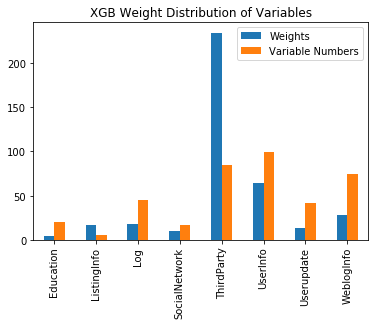

In [31]:
# WeightCI(WeightModel, modelXGBL)
wcolxgb = WeightCI(WeightModel, modelXGBL)
# wcolxgb.to_csv("{}/{}_w_xgb.csv".format(path, title))
RowS_summary(wcolxgb.iloc[:,0], Col_group(wcolxgb.index), ["sum", "count"]).rename(
    columns = {"sum": "Weights", "count": "Variable Numbers"}).plot(kind = "bar", title = "XGB Weight Distribution of Variables")

### xgboost for hyperopt

In [209]:
space = {'max_depth': hp.quniform("max_depth", 1.0, 5.0, 1),
         'min_child_weight': hp.loguniform("min_child_weight", -2, 4),
         'gamma': hp.loguniform("gamma", -6, 2),
         'lambda': hp.loguniform("lambda", 0, 6),
         'colsample_bylevel': hp.uniform('colsample_bylevel', 0.04, 0.15)
}
print(hyperopt.pyll.stochastic.sample(space))

{'gamma': 0.008457338540004933, 'colsample_bylevel': 0.11361085707406962, 'max_depth': 3.0, 'min_child_weight': 44.239900422930084, 'lambda': 9.779636612924643}


In [ ]:
# parda = HpOpt(space, ParModelScore(fmodel=XGBoost)).sort_values(["loss"])
# hpopt调用方法1:
parda = HpOpt(space, lambda x:ParModelScore(x, fmodel = XGBoost), max_evals = 30).sort_values(['loss'])
# parda.to_csv("{}/{}_par_xgb.csv".format(path, title))
# paropt = parda.iloc[0, :-1].to_dict()
# parda

   colsample_bylevel     gamma      lambda  max_depth  min_child_weight
0           0.069557  0.014498  244.916136        4.0         22.594927
0.0    0.926747
1.0    0.073253
dtype: float64
0.0    0.926679
1.0    0.073321
dtype: float64
[0]	train-logloss:0.626517	val-logloss:0.626529
Multiple eval metrics have been passed: 'val-logloss' will be used for early stopping.

Will train until val-logloss hasn't improved in 124 rounds.
[1]	train-logloss:0.571686	val-logloss:0.571707
[2]	train-logloss:0.526029	val-logloss:0.52606
[3]	train-logloss:0.487673	val-logloss:0.487712
[4]	train-logloss:0.455232	val-logloss:0.455279
[5]	train-logloss:0.427652	val-logloss:0.427707
[6]	train-logloss:0.404113	val-logloss:0.404175
[7]	train-logloss:0.383962	val-logloss:0.384031
[8]	train-logloss:0.366671	val-logloss:0.366791
[9]	train-logloss:0.351708	val-logloss:0.35176
[10]	train-logloss:0.338906	val-logloss:0.338958
[11]	train-logloss:0.327766	val-logloss:0.327745
[12]	train-logloss:0.318156	val-loglos

In [ ]:
parda

In [77]:
def GroupSelect(xL, i = 0):
    # xLc = xL.copy()
    # 改写
    xLc = copy.copy(xL)
    ingrp = list(xLc.pop(i))
    exgrp = sum([list(x) for x in xLc], [])
    return(ingrp, exgrp)

def TrainSet(x, y, irtL, ig = 0):
    irt2, irt1 = GroupSelect(irtL, i = ig)
    xt1, xt2 = x.loc[irt1].values, x.loc[irt2].values
    yt1, yt2 = y.loc[irt1].values, y.loc[irt2].values
    return(xt1, xt2, yt1, yt2)

# crosstrain的实质就是用一个list把models存起来即可
def CrossTrain(x, y, irtL, fmodel, **kwargs):
    modelL = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = i)
        modelL.append(fmodel(xt1, xt2, yt1, yt2, seed = i, **kwargs))
    return(modelL)

def CrossValid(x, y, irtL, modelL):
    yt2pL = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = i)
        yt2p = ModelPredict(xt2, modelL[i])
        yt2pL.append(yt2p)
    return(yt2pL)

In [27]:
def Score(y, yp, f = met.roc_auc_score):
    score = f(y, yp)
    print("Score: {:.4f}".format(score))
    return(score)

def ModelPredict(xv, fmodel):
    if(type(fmodel) == xgb.core.Booster):
        xv = xgb.DMatrix(xv, missing = np.nan)
    if(type(fmodel) in [LogisticRegression, lm.stochastic_gradient.SGDClassifier, ensm.bagging.BaggingClassifier,
           ensm.weight_boosting.AdaBoostClassifier, ensm.forest.RandomForestClassifier, ensm.forest.ExtraTreesClassifier]):
        yvp = fmodel.predict_proba(xv)[:,1]
    else:
        yvp = fmodel.predict(xv).flatten()
    return(yvp)

### Model Variable Selection (functions)
Importance of variables for models in Y prediction from model training

In [14]:
def PlotWeight(w, score, hl = 0):
    fig = plt.figure()
    w.plot(kind = "bar", grid = True, title = "Score = {:.4}".format(score))
    plt.plot((0, w.shape[0]), (hl, hl), "k-")   
    fig.show()
def WeightModel(model):
    if(type(model) == lm.logistic.LogisticRegression):
        wic = pd.DataFrame({"LR_beta":model.coef_[0]}, index = x.columns)
    elif(type(model) == xgb.core.Booster):
        wic = (pd.concat([pd.Series(icx, index = ['f{}'.format(x) for x in range(len(icx))]), pd.Series(model.get_fscore())], axis = 1)
               .set_index(0).sort_index().fillna(0)[1])
        wic = wic/np.sum(wic)*wic.shape[0]
    return(wic)
def WeightCI(fweight, modelL):
    w = pd.concat(map(fweight, modelL), axis = 1, keys = np.arange(len(modelL)))
    wb = pd.concat([w.mean(axis = 1), w.std(axis = 1)], axis = 1, keys = ["Mean", "Std"])
    wb["LowerCI"] = wb["Mean"] - wb["Std"]*1.96/np.sqrt(len(modelL))
    wb["UpperCI"] = wb["Mean"] + wb["Std"]*1.96/np.sqrt(len(modelL))
    return(wb)

### Model Comparasion and Composite (functions)
Compare one/multiple models with cross validation and weighted average
* functions for evaluate weights of models according to cross-validation scores for weighted-average prediction
* functions for using weights for models to predict

In [31]:
def ScorePlot(scoreL, labels):
    scmean, scmstd = np.mean(scoreL[:,0]), np.std(scoreL[:,0])/np.sqrt(scoreL.shape[0])
    plt.figure()
    plt.boxplot(scoreL, labels = labels, showmeans = True)
    plt.plot((0, scoreL.shape[1]+1), (scmean, scmean), "g-")
    plt.plot((0, scoreL.shape[1]+1), (scmean - 1.96*scmstd, scmean - 1.96*scmstd), "g--") 
    plt.plot((0, scoreL.shape[1]+1), (scmean + 1.96*scmstd, scmean + 1.96*scmstd), "g--") 
    plt.title("Comp Mean Score: {:.4f},  95% CI: ({:.4f}, {:.4f}),  Folds: {}".format(scmean, scmean - 1.96*scmstd, scmean + 1.96*scmstd, scoreL.shape[0]))
    plt.grid()
    plt.show()
    
def CrossPredict(xv, modelL):
    yvpL = []
    for i in range(len(modelL)):
        yvp = ModelPredict(xv, modelL[i])
        yvpL.append(yvp)
    return(yvpL)
def ModelMPredict(yvpM, w = 1):
    yvpcomp = np.array([np.mean(yvpM[i], axis = 0) for i in range(len(yvpM))]).T.dot(w).flatten()
    return(yvpcomp)

# CrossScore —— 备注：支持多模型融合评估！
def CrossScore(y, yt2pM, irtL, w = 1):
    score = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(y, y, irtL, ig = i)
        yt2L = [yt2pM[j][i] for j in range(len(yt2pM))]
        if(w is 1):
            score.append(list(map(lambda x: Score(yt2, x), yt2L)))
        else:
            score.append(Score(yt2, np.array(yt2L).T * w))
    return(np.array(score))

In [155]:
# 利用上面的scoreL 调试ScoreWeight
scoreL

print np.mean(scoreL)
print np.std(scoreL, axis=0)
print (scoreL - np.mean(scoreL))/np.min(np.std(scoreL, axis = 0))
w = np.exp((scoreL - np.mean(scoreL))/np.min(np.std(scoreL, axis = 0)))
w = np.sum(w/np.sum(w), axis = 0)
w
# def ScoreWeight(score):
#     w = np.exp((score - np.mean(score))/np.min(np.std(score, axis = 0)))
#     w = np.sum(w/np.sum(w), axis = 0)
#     return(w)

0.755133971909
[ 0.02021742]
[[-1.00126463]
 [-0.24116456]
 [-0.29138246]
 [-0.17266004]
 [-0.22466175]
 [ 0.15989216]
 [ 1.53231697]
 [-1.08766382]
 [-0.80939553]
 [ 2.13598365]]


array([ 1.])

In [99]:
print yvpL
print [yvpL]

[array([ 0.60712967,  0.26317337,  0.37157109, ...,  0.27154306,
        0.66620191,  0.71037757]), array([ 0.82488016,  0.86368667,  0.92803537, ...,  0.38957173,
        0.27708265,  0.49090852]), array([ 0.3448166 ,  0.6133273 ,  0.89334697, ...,  0.25953749,
        0.56189599,  0.65358625]), array([ 0.93802716,  0.20710714,  0.20079835, ...,  0.47559013,
        0.22029826,  0.20040918]), array([ 0.73309933,  0.63766764,  0.5757978 , ...,  0.12100408,
        0.51888918,  0.20617774]), array([ 0.7935758 ,  0.5454341 ,  0.31668768, ...,  0.53301771,
        0.08762519,  0.12319302]), array([ 0.84535217,  0.31131372,  0.69666674, ...,  0.64717994,
        0.63764277,  0.82138115]), array([ 0.70229251,  0.50827386,  0.81579159, ...,  0.16585232,
        0.18405449,  0.28704901]), array([ 0.92721942,  0.28003164,  0.44730041, ...,  0.41306519,
        0.18659386,  0.44905885]), array([ 0.60574194,  0.24029793,  0.59566093, ...,  0.09008839,
        0.45080746,  0.66925014])]
[[array([

In [ ]:
def ScoreWeight(score):
    w = np.exp((score - np.mean(score))/np.min(np.std(score, axis = 0)))
    w = np.sum(w/np.sum(w), axis = 0)
    return(w)

# ?!
def CrossScore(y, yt2pM, irtL, w = 1):
    score = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(y, y, irtL, ig = i)
        yt2L = [yt2pM[j][i] for j in range(len(yt2pM))]
        if(w is 1):
            score.append(list(map(lambda x: Score(yt2, x), yt2L)))
        else:
            score.append(Score(yt2, np.array(yt2L).T * w))
    return(np.array(score))

def CrossScoreAnalysis(y, yt2pM, irtL, w = [], labels = None):
    scoreL = CrossScore(y, yt2pM, irtL)
    if(len(w) == 0):
        w = ScoreWeight(scoreL)
    score = CrossScore(y, yt2pM, irtL, w)
    ScorePlot(np.vstack([score, scoreL.T]).T, labels)
    return(scoreL, score, np.array(w))

In [222]:
# 10-fold
irtL = Kfolds(irt, k = 10)
# print irtL
# print len(irtL)
# print len(irtL[0])
def GroupSelect(xL, i = 0):
    # xLc = xL.copy()
    # 改写
    xLc = copy.copy(xL)
    ingrp = list(xLc.pop(i))
    exgrp = sum([list(x) for x in xLc], [])
    return(ingrp, exgrp)

def TrainSet(x, y, irtL, ig = 0):
    irt2, irt1 = GroupSelect(irtL, i = ig)
    xt1, xt2 = x.loc[irt1].values, x.loc[irt2].values
    yt1, yt2 = y.loc[irt1].values, y.loc[irt2].values
    return(xt1, xt2, yt1, yt2)

# i = 0
# xLc = copy.copy(irtL)
# ingrp = list(xLc.pop(i))
# exgrp = sum([list(xx) for xx in xLc], [])
# print ingrp
# print len(exgrp)
# xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = 0)

In [223]:
irtL = Kfolds(irt, k = 10)
xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = 0)

In [276]:
# 分析：kfold后的正负样本比例
# 训练集
def calcBalanceRate(y):
    return y.target.value_counts() / y.shape[0]

print calcBalanceRate(y.loc[irt])

for i in range(10):
    xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = i)
    print calcBalanceRate(pd.DataFrame(yt1.flatten(), columns=['target']))

0.0    0.926733
1.0    0.073267
Name: target, dtype: float64
0.0    0.926444
1.0    0.073556
Name: target, dtype: float64
0.0    0.927111
1.0    0.072889
Name: target, dtype: float64
0.0    0.926481
1.0    0.073519
Name: target, dtype: float64
0.0    0.926704
1.0    0.073296
Name: target, dtype: float64
0.0    0.926185
1.0    0.073815
Name: target, dtype: float64
0.0    0.927259
1.0    0.072741
Name: target, dtype: float64
0.0    0.926667
1.0    0.073333
Name: target, dtype: float64
0.0    0.927333
1.0    0.072667
Name: target, dtype: float64
0.0    0.926741
1.0    0.073259
Name: target, dtype: float64
0.0    0.926407
1.0    0.073593
Name: target, dtype: float64


In [18]:
model = Classifier(xt1, xt2, yt1, yt2, seed = 0, modeltype = lm.LogisticRegression, parmodel = 
                   {"penalty": "l2", "C": 0.003, "class_weight": 'balanced', 'solver': 'sag'})
# 备注：如何确定超参数的最优取值？如C=0.003

Score: 0.7779
Time: 3.09 seconds


In [21]:
# model = XGBoost(xt1, xt2, yt1, yt2, seed = 0, parmodel = 
#                 {'colsample_bylevel': 0.07, 'eta': 0.05, 'max_depth': 3, 'lambda': 50, 'min_child_weight': 1.5, 'gamma': 0.2})

In [22]:
# model = DNN(xt1, xt2, yt1, yt2, seed = 0, parmodel = 
#             {"nhidlayer": 1, "rdrop": 0.5, "nhidnode": 500, 'optimizer': "rmsprop", "batch_size": 64, "dropout": 0.5})

In [24]:
# model = Classifier(xt1, xt2, yt1, yt2, seed = 0, modeltype = ensm.BaggingClassifier, parmodel = 
#                    {"base_estimator":ensm.ExtraTreesClassifier(criterion='entropy', min_weight_fraction_leaf=0, max_depth = 8),
#                    "n_estimators": 1000, "max_features": 1})

## Model Hyper-parameters Optimization
Hyper-parameters optimization for models with cross validaion

Warning: The process of hyper-parameters optimization may take a very long time = N(iterations)\*K(folds)\*T(single model)

In [78]:
# debug for ParModelScore
par = {"penalty": "l2", "C": 0.003, "class_weight": 'balanced', 'solver': 'sag'}
irtL_t = Kfolds(irt, k = 5)
irtL_t
# modelL = CrossTrain(x, y, irtL_t, fmodel=Classifier, parmodel = par)
# yt2pL = CrossValid(x, y, irtL_t, modelL)
# score = np.mean(CrossScoreAnalysis(y, [yt2pL], irtL)[0])
# return(-score)

[array([40685, 45632, 91617, ..., 56427, 64931, 46243]),
 array([87095, 34682, 53412, ..., 16891, 42695, 66844]),
 array([85165, 55484, 57927, ...,  9648, 49878, 67774]),
 array([32176, 10724, 22908, ..., 48079, 41510,   609]),
 array([33413, 12624, 50172, ..., 44525, 10564,  9270])]

In [65]:
# [yt2pL]
# score = np.mean(CrossScoreAnalysis(y, [yt2pL], irtL)[0])
scoreL = CrossScore(y, [yt2pL], irtL_t)
print scoreL
print scoreL.shape
w = []
labels = None
if(len(w) == 0):
    w = ScoreWeight(scoreL)
score = CrossScore(y, yt2pM, irtL, w)
ScorePlot(np.vstack([score, scoreL.T]).T, labels)
return(scoreL, score, np.array(w))

Score: 0.7655
Score: 0.7490
Score: 0.7599
Score: 0.7823
Score: 0.7748
[[ 0.76546057]
 [ 0.74904007]
 [ 0.7599496 ]
 [ 0.78234263]
 [ 0.77481701]]
(5, 1)


0
[ 1.]
Score: 0.7655
Score: 0.7490
Score: 0.7599
Score: 0.7823
Score: 0.7748


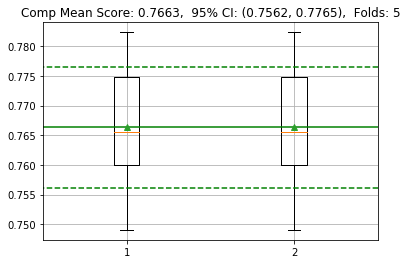

In [78]:
w = []
labels = None
print len(w)
if len(w) == 0:
    w = np.exp((scoreL - np.mean(scoreL))/np.min(np.std(scoreL, axis = 0)))
    w = np.sum(w/np.sum(w), axis = 0)
print w
score = CrossScore(y, [yt2pL], irtL_t, w)
ScorePlot(np.vstack([score, scoreL.T]).T, labels)

In [60]:
from hyperopt import fmin, tpe, hp, STATUS_OK, Trials
import hyperopt.pyll.stochastic

def ParColScore(par, fmodel = XGBoost):
    icx = list(wcol.index[wcol.iloc[:,1] > par["a"]])
    x = dac.loc[:, icx]
    x = x.apply(lambda x: x.fillna(x.median()),axis=0)
    x = (x.rank(pct = True)-0.5/x.shape[0]).apply(st.norm.ppf)
    modelL = CrossTrain(x, y, irtL, fmodel)
    yt2pL = CrossValid(x, y, irtL, modelL)
    score = np.mean(CrossScoreAnalysis(y, [yt2pL], irtL)[0])
    return(-score)

# 5-folds
# CrossTrain five models
def ParModelScore(par, fmodel = XGBoost):
    irtL = Kfolds(irt, k = 5)
    modelL = CrossTrain(x, y, irtL, fmodel, parmodel = par)
    yt2pL = CrossValid(x, y, irtL, modelL)
    score = np.mean(CrossScoreAnalysis(y, [yt2pL], irtL)[0])
    return(-score)

def HpOpt(space, fhpscore, seed = 0, max_evals = 50):
    def Obj(par):
        print(pd.DataFrame(par, index = [seed]))
        return({
            'loss': fhpscore(par),
            'status': STATUS_OK,
            'loss_variance': 5e-5
            })
    
    np.random.seed(seed)
    trials = Trials()
    best = fmin(Obj,
        space=space,
        algo=tpe.suggest,
        max_evals=max_evals,
        trials=trials)
    op = pd.concat([pd.DataFrame([sum(list(trials.trials[i]["misc"]["vals"].values()), []) for i in range(len(trials))],
                                 columns = list(trials.trials[0]["misc"]["vals"].keys())),
           pd.DataFrame({"loss": trials.losses()})], axis = 1)
    return(op)

In [69]:
print np.exp(-10)
print np.exp(-1)
space = {'C': hp.loguniform('C', -10, -1)}
print(hyperopt.pyll.stochastic.sample(space))

4.53999297625e-05
0.367879441171
{'C': 0.00010508093979893652}


## Model Training
Cross model and prediction results from optimized model variables and hyper-parameters

In [93]:
def Kfolds(x, k = 10, seed = 1):
    np.random.seed(seed)
    xL = np.array_split(np.random.choice(x, len(x), replace = False), k) #  相当于shuffle
    return(xL)

def GroupSelect(xL, i = 0):
    # xLc = xL.copy()
    # 改写
    xLc = copy.copy(xL)
    ingrp = list(xLc.pop(i))
    exgrp = sum([list(x) for x in xLc], [])
    return(ingrp, exgrp)

def TrainSet(x, y, irtL, ig = 0):
    irt2, irt1 = GroupSelect(irtL, i = ig)
    xt1, xt2 = x.loc[irt1].values, x.loc[irt2].values
    yt1, yt2 = y.loc[irt1].values, y.loc[irt2].values
    return(xt1, xt2, yt1, yt2)

def CrossTrain(x, y, irtL, fmodel, **kwargs):
    modelL = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = i)
        modelL.append(fmodel(xt1, xt2, yt1, yt2, seed = i, **kwargs))
    return(modelL)

def CrossValid(x, y, irtL, modelL):
    yt2pL = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(x, y, irtL, ig = i)
        yt2p = ModelPredict(xt2, modelL[i])
        yt2pL.append(yt2p)
    return(yt2pL)

In [94]:
def ScoreWeight(score):
    w = np.exp((score - np.mean(score))/np.min(np.std(score, axis = 0)))
    w = np.sum(w/np.sum(w), axis = 0)
    return(w)

# ?!
def CrossScore(y, yt2pM, irtL, w = 1):
    score = []
    for i in range(len(irtL)):
        xt1, xt2, yt1, yt2 = TrainSet(y, y, irtL, ig = i)
        yt2L = [yt2pM[j][i] for j in range(len(yt2pM))]
        if(w is 1):
            score.append(list(map(lambda x: Score(yt2, x), yt2L)))
        else:
            score.append(Score(yt2, np.array(yt2L).T * w))
    return(np.array(score))

def CrossScoreAnalysis(y, yt2pM, irtL, w = [], labels = None):
    scoreL = CrossScore(y, yt2pM, irtL)
    if(len(w) == 0):
        w = ScoreWeight(scoreL)
    score = CrossScore(y, yt2pM, irtL, w)
    ScorePlot(np.vstack([score, scoreL.T]).T, labels)
    return(scoreL, score, np.array(w))